In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [2]:
df = pd.read_csv('dbfinal.csv',parse_dates=['Date'])


In [3]:
df.head()

,States/UTs,Rice,Wheat,Atta (Wheat),Gram Dal,Tur/Arhar Dal,Urad Dal,Moong Dal,Masoor Dal,Sugar,...,Soya Oil (Packed),Sunflower Oil (Packed),Palm Oil (Packed),Gur,Tea Loose,Salt Pack (Iodised),Potato,Onion,Tomato,Date
0,Andaman and Nicobar,45.00,40.00,65.00,84.67,124.33,137.33,121.67,115.67,51.67,...,NaN,206.33,145.67,71.67,305.00,20.00,50.00,43.33,80.00,2022-10-01
1,Andhra Pradesh,53.50,41.75,44.50,72.00,118.75,122.50,108.00,107.75,41.00,...,170.00,159.00,108.00,55.25,340.25,20.00,34.25,25.25,34.50,2022-10-01
2,Arunachal pradesh,31.50,NaN,42.50,85.67,116.67,114.33,111.50,105.00,49.00,...,153.50,220.00,NaN,69.00,300.00,16.00,29.33,36.67,59.00,2022-10-01
3,Assam,26.50,29.00,34.50,65.50,110.00,88.00,95.00,82.50,42.50,...,142.50,175.00,135.00,47.00,187.50,11.50,27.50,27.50,50.00,2022-10-01
4,Bihar,38.63,27.14,33.46,68.17,108.71,105.80,101.57,88.11,42.83,...,150.57,189.44,127.81,47.69,290.71,21.03,20.91,21.83,45.31,2022-10-01


In [4]:
print(df.columns)

Index(['States/UTs', 'Rice', 'Wheat', 'Atta (Wheat)', 'Gram Dal',
       'Tur/Arhar Dal', 'Urad Dal', 'Moong Dal', 'Masoor Dal', 'Sugar',
       'Milk @', 'Groundnut Oil (Packed)', 'Mustard Oil (Packed)',
       'Vanaspati (Packed)', 'Soya Oil (Packed)', 'Sunflower Oil (Packed)',
       'Palm Oil (Packed)', 'Gur', 'Tea Loose', 'Salt Pack (Iodised)',
       'Potato', 'Onion', 'Tomato', 'Date'],
      dtype='object')


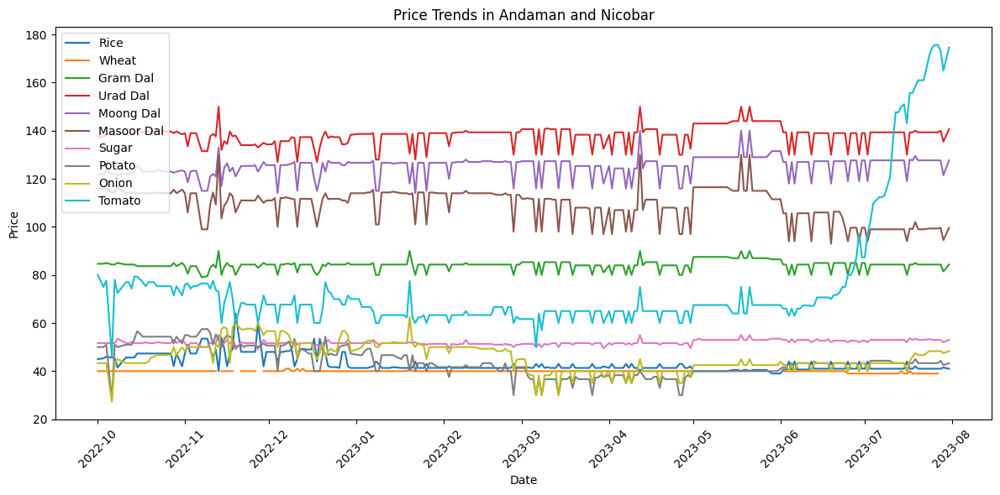

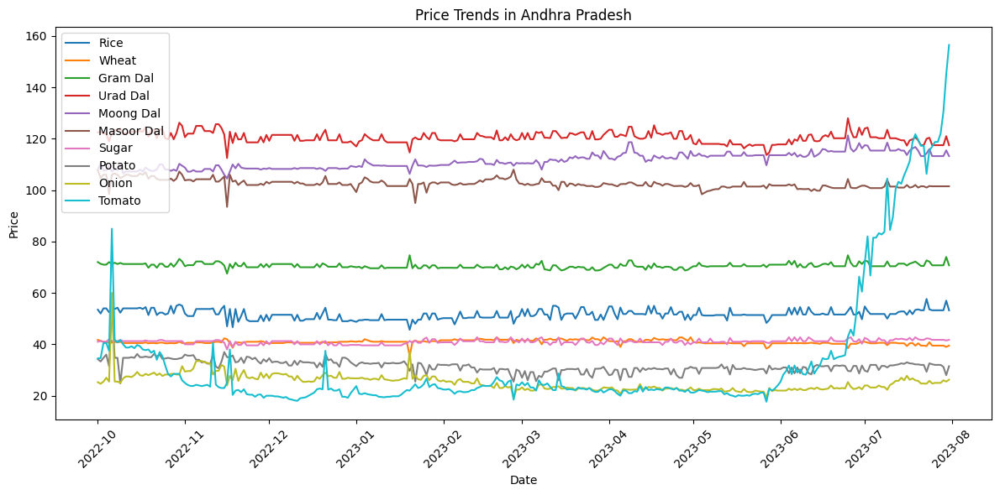

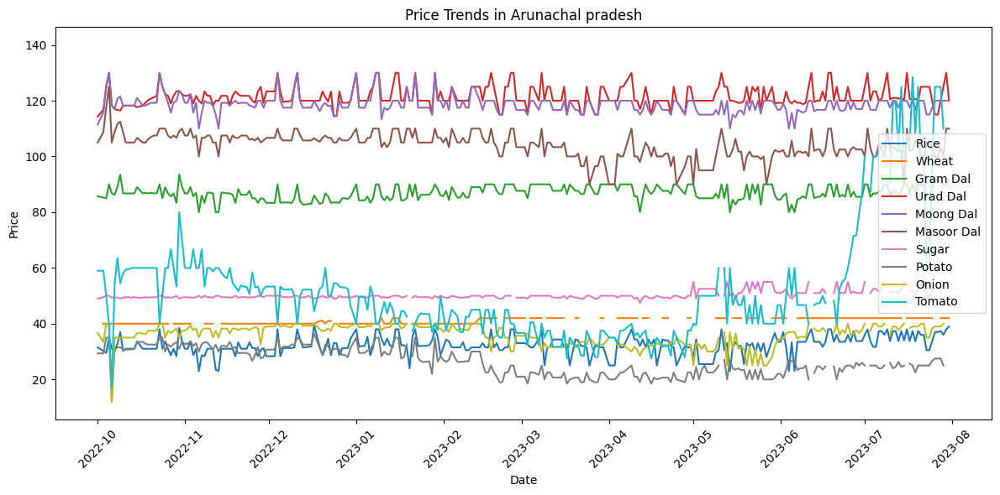

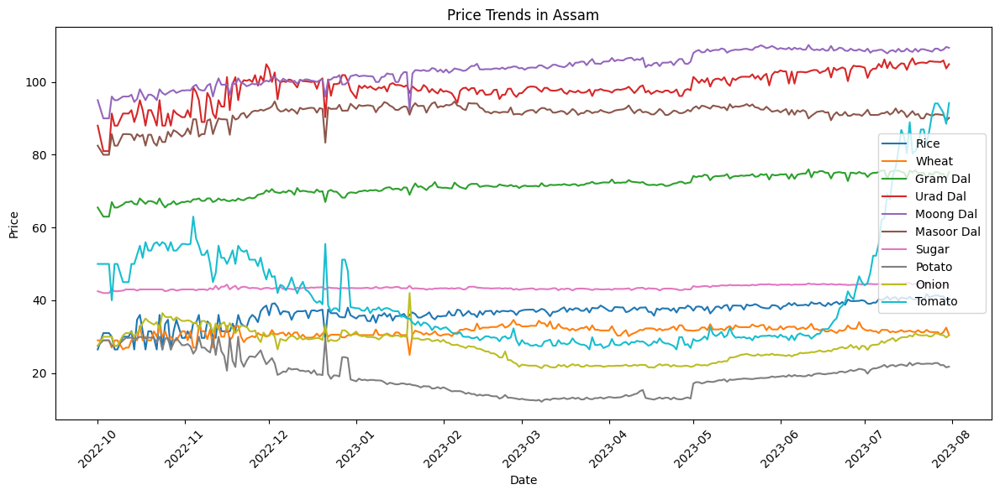

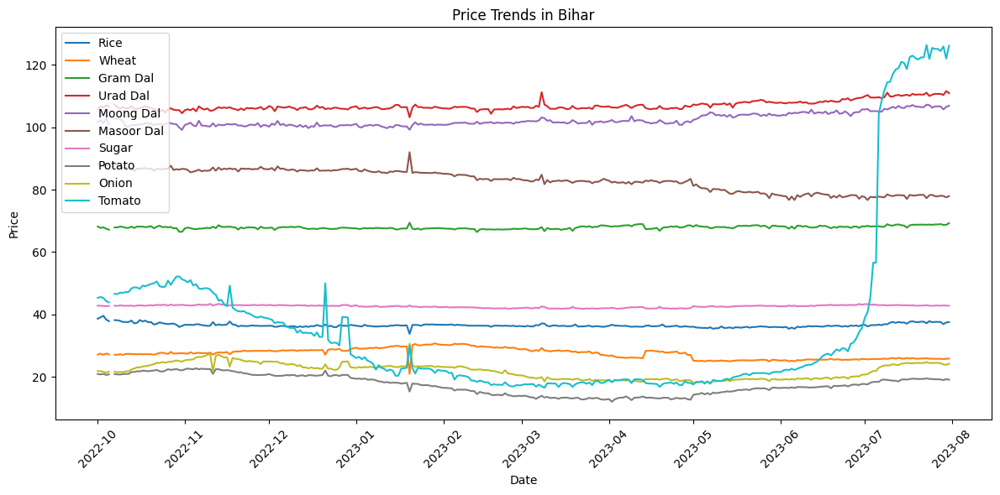

...

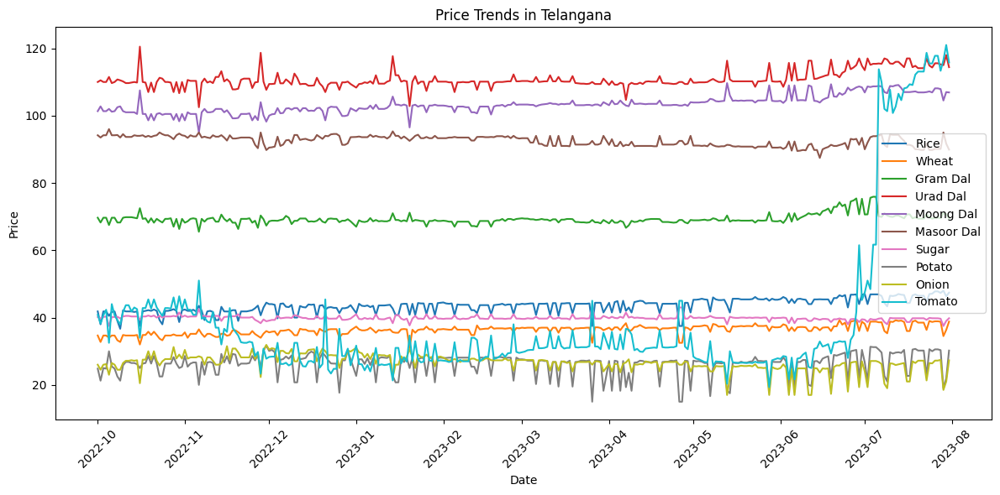

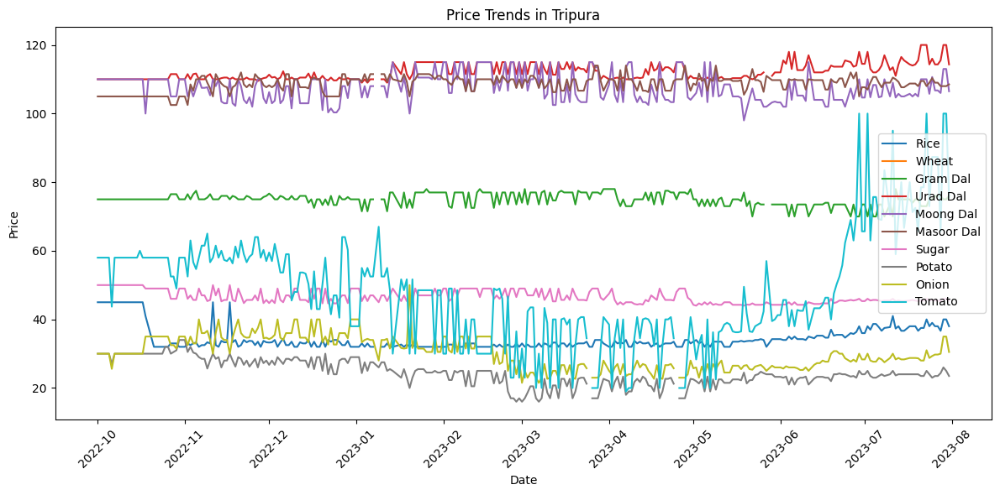

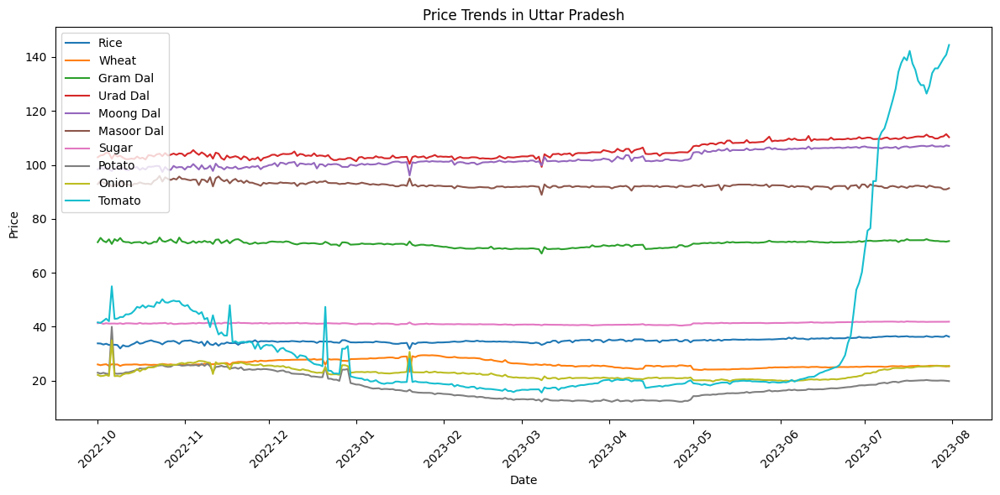

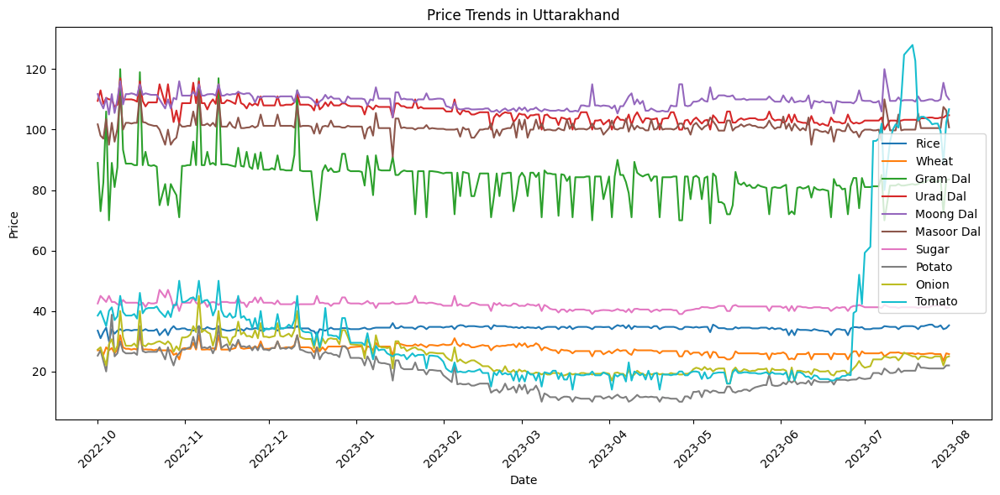

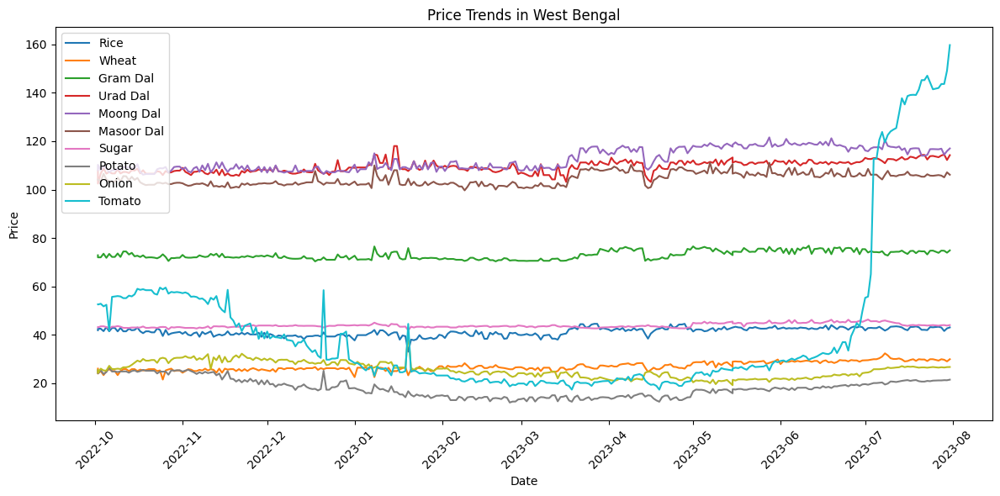

In [5]:
grouped_data = df.groupby('States/UTs')

for state, state_data in grouped_data:
    plt.figure(figsize=(12, 6))
    plt.plot(state_data['Date'], state_data['Rice'],  label='Rice')
    plt.plot(state_data['Date'], state_data['Wheat'],  label='Wheat')
    plt.plot(state_data['Date'], state_data['Gram Dal'],  label='Gram Dal')
    plt.plot(state_data['Date'], state_data['Urad Dal'],  label='Urad Dal')
    plt.plot(state_data['Date'], state_data['Moong Dal'],  label='Moong Dal')
    plt.plot(state_data['Date'], state_data['Masoor Dal'],  label='Masoor Dal')
    plt.plot(state_data['Date'], state_data['Sugar'],  label='Sugar')
    plt.plot(state_data['Date'], state_data['Potato'],  label='Potato')
    plt.plot(state_data['Date'], state_data['Onion'],  label='Onion')
    plt.plot(state_data['Date'], state_data['Tomato'],  label='Tomato')


    plt.title(f'Price Trends in {state}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


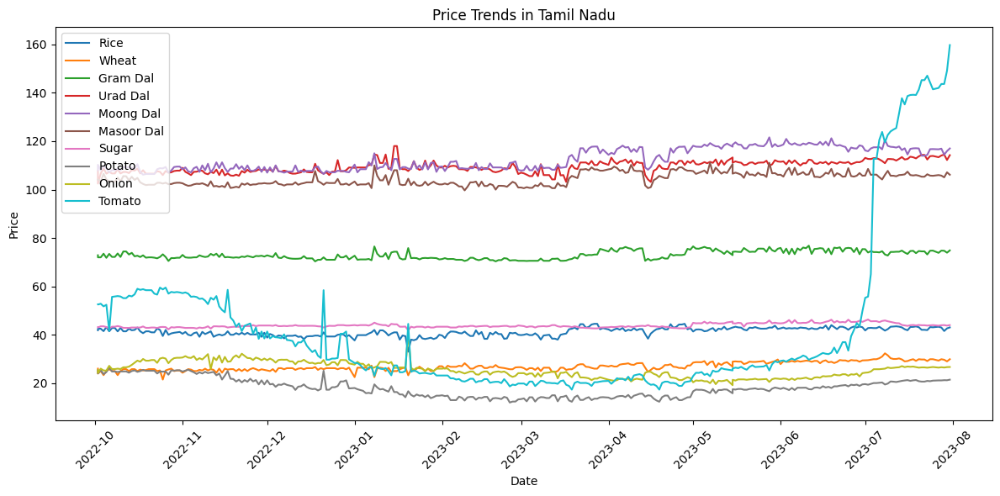

In [6]:
df_tamil_nadu = df[df['States/UTs'] == 'Tamil Nadu']

plt.figure(figsize=(12, 6))
plt.plot(state_data['Date'], state_data['Rice'],  label='Rice')
plt.plot(state_data['Date'], state_data['Wheat'],  label='Wheat')
plt.plot(state_data['Date'], state_data['Gram Dal'],  label='Gram Dal')
plt.plot(state_data['Date'], state_data['Urad Dal'],  label='Urad Dal')
plt.plot(state_data['Date'], state_data['Moong Dal'],  label='Moong Dal')
plt.plot(state_data['Date'], state_data['Masoor Dal'],  label='Masoor Dal')
plt.plot(state_data['Date'], state_data['Sugar'],  label='Sugar')
plt.plot(state_data['Date'], state_data['Potato'],  label='Potato')
plt.plot(state_data['Date'], state_data['Onion'],  label='Onion')
plt.plot(state_data['Date'], state_data['Tomato'],  label='Tomato')

plt.title('Price Trends in Tamil Nadu')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [7]:
len(df)


9665

In [8]:
len(df_tamil_nadu)

302

The Mean Squared Error of the predictions is: 4074.76541216514


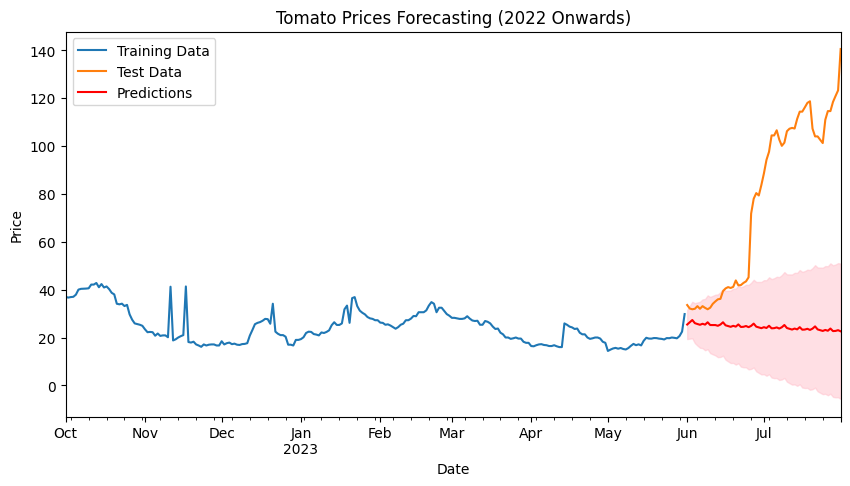

In [9]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

db_csv_path = 'dbfinal.csv'
data = pd.read_csv(db_csv_path, parse_dates=['Date'], index_col='Date')

tn_tomato_prices = data.loc[data['States/UTs'] == 'Tamil Nadu', 'Tomato']

tn_tomato_prices = tn_tomato_prices.resample('D').ffill()

tn_tomato_prices_2022 = tn_tomato_prices['2022':]

split_point = int(len(tn_tomato_prices_2022) * 0.8)
train, test = tn_tomato_prices_2022[:split_point], tn_tomato_prices_2022[split_point:]

model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
model_fit = model.fit(disp=False)

predictions = model_fit.get_prediction(start=test.index[0], end=test.index[-1])
predictions_mean = predictions.predicted_mean
predictions_ci = predictions.conf_int()

mse = mean_squared_error(test, predictions_mean)
print(f"The Mean Squared Error of the predictions is: {mse}")

plt.figure(figsize=(10, 5))
train.plot(label='Training Data')
test.plot(label='Test Data')
predictions_mean.plot(label='Predictions', color='red')
plt.fill_between(predictions_ci.index, predictions_ci.iloc[:, 0], predictions_ci.iloc[:, 1], color='pink', alpha=0.5)
plt.title('Tomato Prices Forecasting (2022 Onwards)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Best SARIMAX parameters: ((0, 1, 0), (0, 1, 0, 12))
Minimum MSE: 1148.6341836153172


NameError: ignored

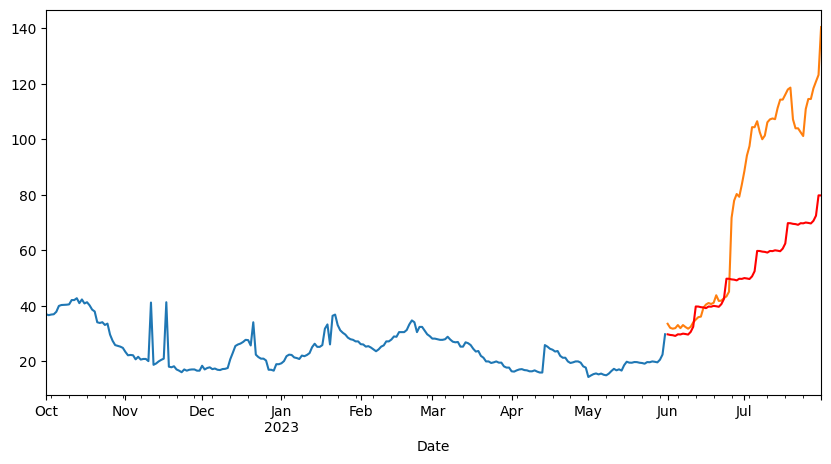

In [12]:
import itertools

p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

best_params = None
best_mse = float('inf')

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:

            model = SARIMAX(train, order=param, seasonal_order=param_seasonal)
            model_fit = model.fit(disp=False)

            predictions = model_fit.get_prediction(start=test.index[0], end=test.index[-1])
            predictions_mean = predictions.predicted_mean

            mse = mean_squared_error(test, predictions_mean)

            if mse < best_mse:
                best_params = (param, param_seasonal)
                best_mse = mse

        except:
            continue

print(f"Best SARIMAX parameters: {best_params}")
print(f"Minimum MSE: {best_mse}")

best_model = SARIMAX(train, order=best_params[0], seasonal_order=best_params[1])
best_model_fit = best_model.fit(disp=False)

best_predictions = best_model_fit.get_prediction(start=test.index[0], end=test.index[-1])
best_predictions_mean = best_predictions.predicted_mean

plt.figure(figsize=(10, 5))
train.plot(label='Training Data')
test.plot(label='Test Data')
best_predictions_mean.plot(label='Best Predictions', color='red')
plt.fill_between(best_predictions_ci.index, best_predictions_ci.iloc[:, 0], best_predictions_ci.iloc[:, 1], color='pink', alpha=0.5)
plt.title('Tomato Prices Forecasting (2022 Onwards) - Best Model')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Best SARIMAX parameters: ((0, 1, 0), (0, 1, 0, 12))
Minimum MSE: 1148.6341836153172
The Mean Squared Error of the best model predictions is: 1148.6341836153172


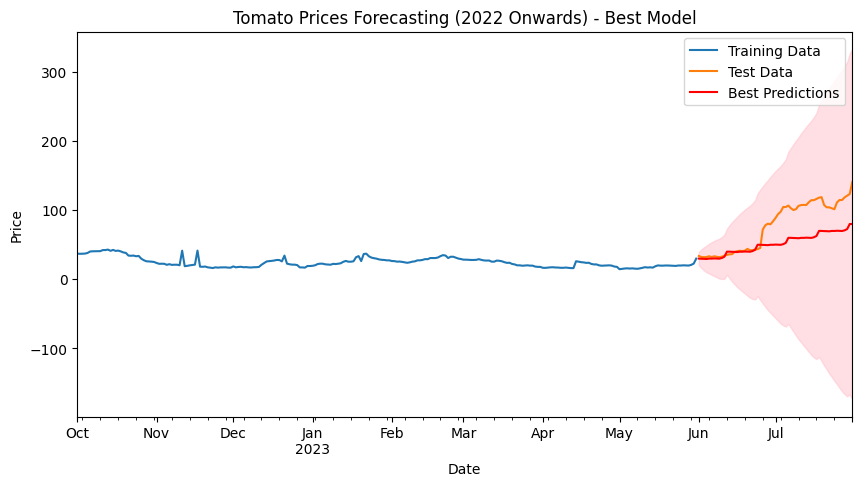

In [13]:
import itertools

print(f"Best SARIMAX parameters: {best_params}")
print(f"Minimum MSE: {best_mse}")

best_model = SARIMAX(train, order=best_params[0], seasonal_order=best_params[1])
best_model_fit = best_model.fit(disp=False)

best_predictions = best_model_fit.get_prediction(start=test.index[0], end=test.index[-1])
best_predictions_mean = best_predictions.predicted_mean
best_predictions_ci = best_predictions.conf_int()

mse_best_model = mean_squared_error(test, best_predictions_mean)
print(f"The Mean Squared Error of the best model predictions is: {mse_best_model}")

plt.figure(figsize=(10, 5))
train.plot(label='Training Data')
test.plot(label='Test Data')
best_predictions_mean.plot(label='Best Predictions', color='red')
plt.fill_between(best_predictions_ci.index, best_predictions_ci.iloc[:, 0], best_predictions_ci.iloc[:, 1], color='pink', alpha=0.5)
plt.title('Tomato Prices Forecasting (2022 Onwards) - Best Model')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


In [ ]:

print(f"Best SARIMAX parameters: {best_params}")
print(f"Minimum MSE: {best_mse}")

best_model = SARIMAX(train, order=best_params[0], seasonal_order=best_params[1])
best_model_fit = best_model.fit(disp=False)

best_predictions = best_model_fit.get_prediction(start=test.index[0], end=test.index[-1])
best_predictions_mean = best_predictions.predicted_mean
best_predictions_ci = best_predictions.conf_int()

mse_best_model = mean_squared_error(test, best_predictions_mean)
print(f"The Mean Squared Error of the best model predictions is: {mse_best_model}")

plt.figure(figsize=(10, 5))
train.plot(label='Training Data')
test.plot(label='Test Data')
best_predictions_mean.plot(label='Best Predictions', color='red')
plt.fill_between(best_predictions_ci.index, best_predictions_ci.iloc[:, 0], best_predictions_ci.iloc[:, 1], color='pink', alpha=0.5)
plt.title('Tomato Prices Forecasting (2022 Onwards) - Best Model')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [14]:
best_predictions = best_model_fit.get_prediction(start=test.index[0], end=test.index[-1])
best_predictions_mean = best_predictions.predicted_mean
best_predictions_ci = best_predictions.conf_int()

mse_best_model = mean_squared_error(test, best_predictions_mean)
print(f"The Mean Squared Error of the best model predictions is: {mse_best_model}")

comparison_df = pd.DataFrame({
    'Date': test.index,
    'Actual_Price': test.values,
    'Predicted_Price': best_predictions_mean.values,
})

print("Comparison of Actual and Predicted Prices:")
print(comparison_df)

The Mean Squared Error of the best model predictions is: 1148.6341836153172
Comparison of Actual and Predicted Prices:
         Date  Actual_Price  Predicted_Price
0  2023-06-01         33.57            29.76
1  2023-06-02         32.11            29.54
2  2023-06-03         31.80            29.44
3  2023-06-04         32.00            29.19
4  2023-06-05         33.10            29.77
..        ...           ...              ...
56 2023-07-27        114.57            69.72
57 2023-07-28        118.39            70.66
58 2023-07-29        120.86            72.52
59 2023-07-30        123.24            79.84
60 2023-07-31        140.50            79.81

[61 rows x 3 columns]


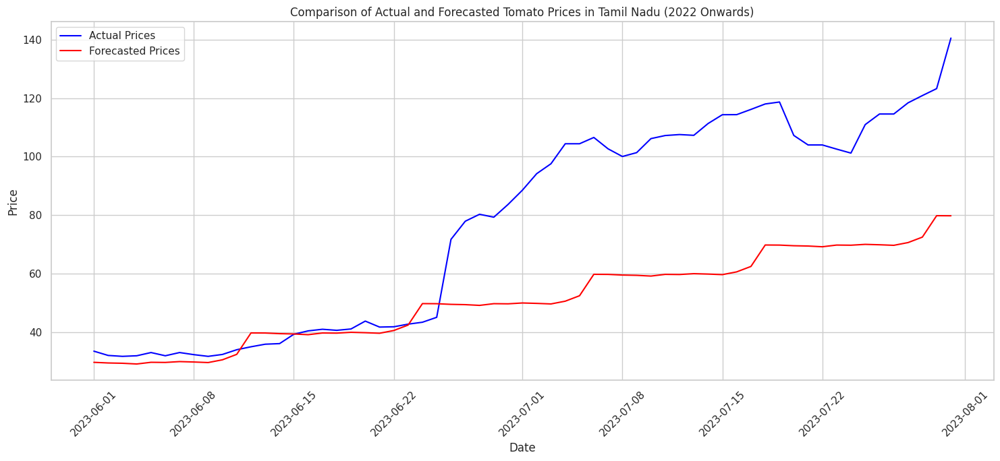

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="whitegrid")

plt.figure(figsize=(15, 7))

sns.lineplot(data=comparison_df, x='Date', y='Actual_Price', label='Actual Prices', color='blue')

sns.lineplot(data=comparison_df, x='Date', y='Predicted_Price', label='Forecasted Prices', color='red')

plt.title('Comparison of Actual and Forecasted Tomato Prices in Tamil Nadu (2022 Onwards)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/pyth

Comparison of Actual and ARIMA Predicted Prices:
         Date  Actual_Price  ARIMA_Predicted_Price
0  2023-04-06         58.20              57.612523
1  2023-04-07         53.83              54.639232
2  2023-04-08         41.67              51.271922
3  2023-04-09         26.50              52.781259
4  2023-04-10         52.50              57.152815
5  2023-04-11         51.67              56.633786
6  2023-04-12         50.50              52.140767
7  2023-04-13         50.33              51.721601
8  2023-04-14         20.00              55.935124
9  2023-04-15         60.00              57.451161
10 2023-04-16         60.00              53.568289
11 2023-04-17           NaN              51.206468
12 2023-04-18           NaN              54.450279
13 2023-04-20         60.00              57.570695
14 2023-04-21         60.00              55.092096
15 2023-04-22         60.00              51.429047
16 2023-04-23         60.00              53.009791
17 2023-04-24           NaN      

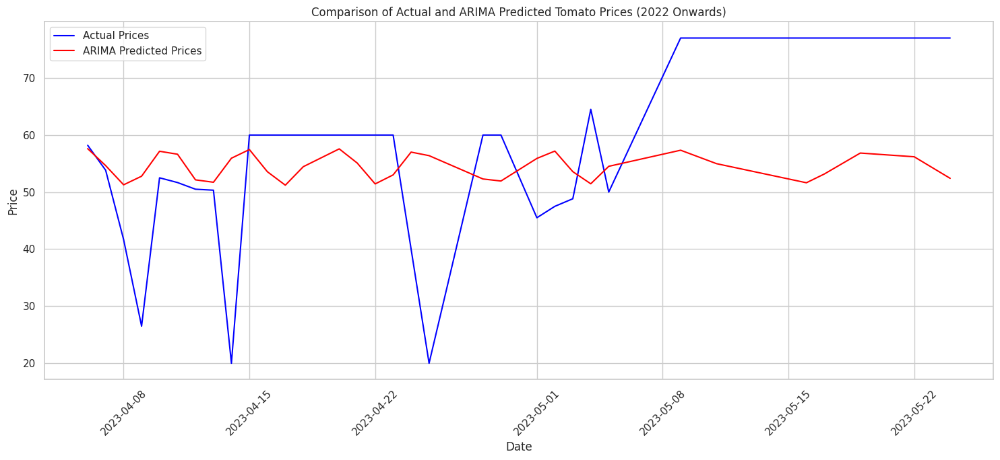

In [22]:
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import numpy as np
import seaborn as sns
arima_model = ARIMA(train, order=(5, 1, 5)) # Adjust order based on your data
arima_results = arima_model.fit()
predictions = arima_results.get_forecast(steps=len(test))
predictions_mean = predictions.predicted_mean
predictions_ci = predictions.conf_int()


arima_predictions = arima_results.get_forecast(steps=len(test))
arima_predictions_mean = arima_predictions.predicted_mean
arima_comparison_df = pd.DataFrame({
 'Date': test.index,
 'Actual_Price': test.values,
 'ARIMA_Predicted_Price': arima_predictions_mean.values,
})
print("Comparison of Actual and ARIMA Predicted Prices:")
print(arima_comparison_df)
sns.set_theme(style="whitegrid")
plt.figure(figsize=(15, 7))
sns.lineplot(data=arima_comparison_df, x='Date', y='Actual_Price', label='Actual Prices',
color='blue')
sns.lineplot(data=arima_comparison_df, x='Date', y='ARIMA_Predicted_Price',
label='ARIMA Predicted Prices', color='red')
plt.title('Comparison of Actual and ARIMA Predicted Tomato Prices (2022 Onwards)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

scaler = MinMaxScaler(feature_range=(0, 1))
tn_tomato_prices_normalized = scaler.fit_transform(np.array(tn_tomato_prices).reshape(-1, 1))

def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back):
        a = dataset[i:(i + look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

look_back = 7
X, Y = create_dataset(tn_tomato_prices_normalized, look_back)

split_point = int(len(X) * 0.8)
X_train, X_test, Y_train, Y_test = X[:split_point], X[split_point:], Y[:split_point], Y[split_point:]

X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(LSTM(units=50))
model.add(Dense(units=1))
model.compile(optimizer='adam', loss='mean_squared_error')

model.fit(X_train, Y_train, epochs=100, batch_size=32, verbose=1)

predictions = model.predict(X_test)
predictions = scaler.inverse_transform(predictions)
Y_test_inverse = scaler.inverse_transform(np.array(Y_test).reshape(-1, 1))

mse = mean_squared_error(Y_test_inverse, predictions)
print(f"The Mean Squared Error of the predictions is: {mse}")

Epoch 1/100
8/8 [==============================] - 9s 30ms/step - loss: 0.0044
Epoch 2/100
8/8 [==============================] - 0s 33ms/step - loss: 0.0022
Epoch 3/100
8/8 [==============================] - 0s 31ms/step - loss: 0.0015
Epoch 4/100
8/8 [==============================] - 0s 22ms/step - loss: 0.0011
Epoch 5/100
8/8 [==============================] - 0s 25ms/step - loss: 9.2746e-04
Epoch 6/100
8/8 [==============================] - 0s 31ms/step - loss: 8.8915e-04
Epoch 7/100
8/8 [==============================] - 0s 22ms/step - loss: 8.9245e-04
Epoch 8/100
8/8 [==============================] - 0s 24ms/step - loss: 8.7530e-04
Epoch 9/100
8/8 [==============================] - 0s 21ms/step - loss: 8.8800e-04
Epoch 10/100
8/8 [==============================] - 0s 22ms/step - loss: 9.3456e-04
Epoch 11/100
8/8 [==============================] - 0s 24ms/step - loss: 9.8741e-04
Epoch 12/100
8/8 [==============================] - 0s 37ms/step - loss: 8.5464e-04
Epoch 13/100
8/8 

In [24]:
lstm_comparison_df = pd.DataFrame({
    'Date': tn_tomato_prices.index[-len(Y_test_inverse):],
    'Actual_Price': Y_test_inverse.flatten(),
    'LSTM_Predicted_Price': predictions.flatten(),
})

print("Comparison of Actual and LSTM Predicted Prices:")
print(lstm_comparison_df)

Comparison of Actual and LSTM Predicted Prices:
         Date  Actual_Price  LSTM_Predicted_Price
0  2023-06-02         32.11             29.222424
1  2023-06-03         31.80             31.866081
2  2023-06-04         32.00             32.828053
3  2023-06-05         33.10             32.773186
4  2023-06-06         32.00             32.643997
5  2023-06-07         33.10             32.014172
6  2023-06-08         32.38             32.125622
7  2023-06-09         31.80             32.214806
8  2023-06-10         32.45             31.899124
9  2023-06-11         34.06             31.807383
10 2023-06-12         35.07             32.426357
11 2023-06-13         35.95             33.498604
12 2023-06-14         36.15             34.597557
13 2023-06-15         39.35             35.467781
14 2023-06-16         40.50             37.098740
15 2023-06-17         41.05             38.778053
16 2023-06-18         40.69             40.081421
17 2023-06-19         41.15             40.653950
18

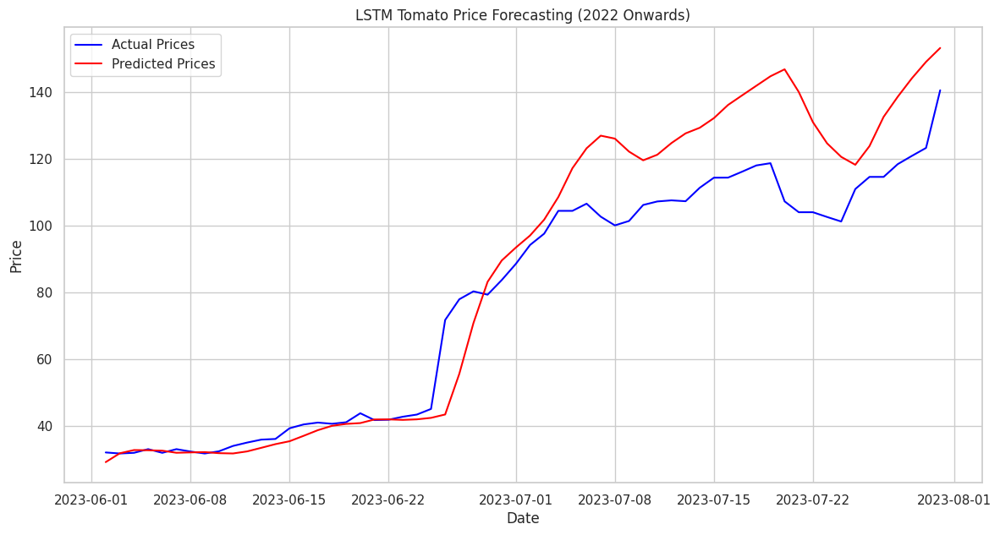

In [25]:
plt.figure(figsize=(14, 7))
plt.plot(lstm_comparison_df['Date'], lstm_comparison_df['Actual_Price'], label='Actual Prices', color='blue')
plt.plot(lstm_comparison_df['Date'], lstm_comparison_df['LSTM_Predicted_Price'], label='Predicted Prices', color='red')
plt.title('LSTM Tomato Price Forecasting (2022 Onwards)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Streaming output truncated to the last 5000 lines.
Epoch 2/100
8/8 [==============================] - 0s 20ms/step - loss: 0.0023
Epoch 3/100
8/8 [==============================] - 0s 19ms/step - loss: 0.0015
Epoch 4/100
8/8 [==============================] - 0s 18ms/step - loss: 0.0011
Epoch 5/100
8/8 [==============================] - 0s 17ms/step - loss: 0.0011
Epoch 6/100
8/8 [==============================] - 0s 19ms/step - loss: 0.0011
Epoch 7/100
8/8 [==============================] - 0s 16ms/step - loss: 0.0011
Epoch 8/100
8/8 [==============================] - 0s 17ms/step - loss: 0.0011
Epoch 9/100
8/8 [==============================] - 0s 19ms/step - loss: 0.0010
Epoch 10/100
8/8 [==============================] - 0s 17ms/step - loss: 0.0011
Epoch 11/100
8/8 [==============================] - 0s 16ms/step - loss: 0.0011
Epoch 12/100
8/8 [==============================] - 0s 16ms/step - loss: 0.0011
Epoch 13/100
8/8 [==============================] - 0s 15ms/step - loss: 0.00

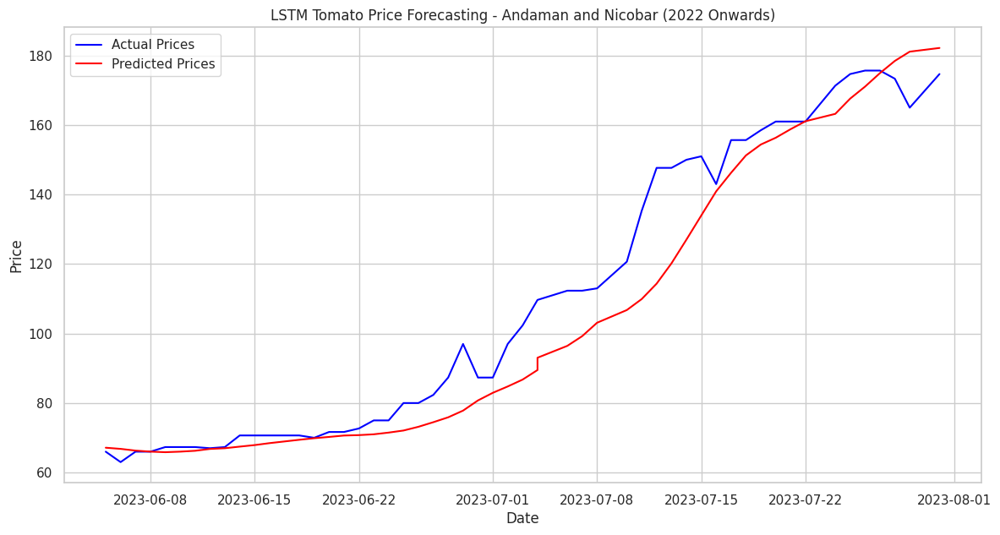

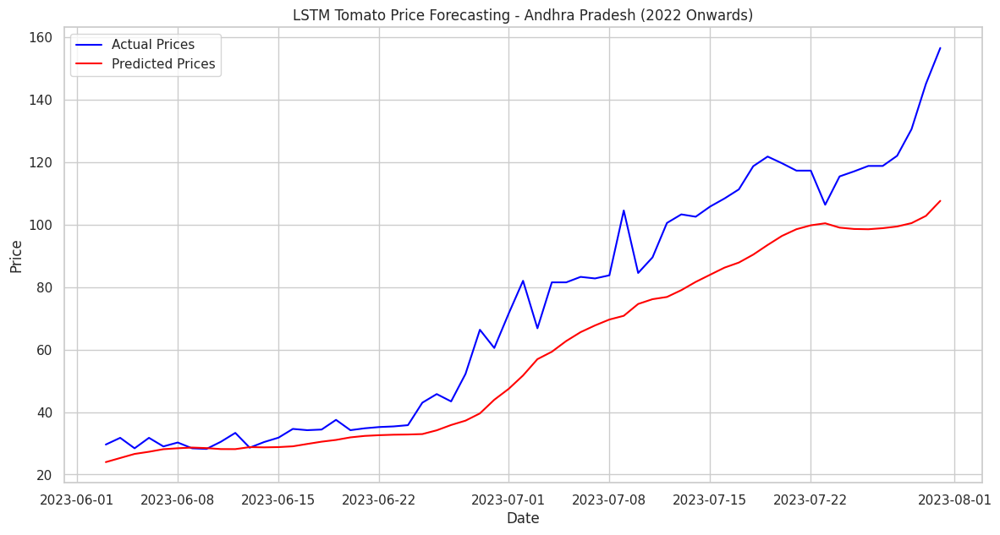

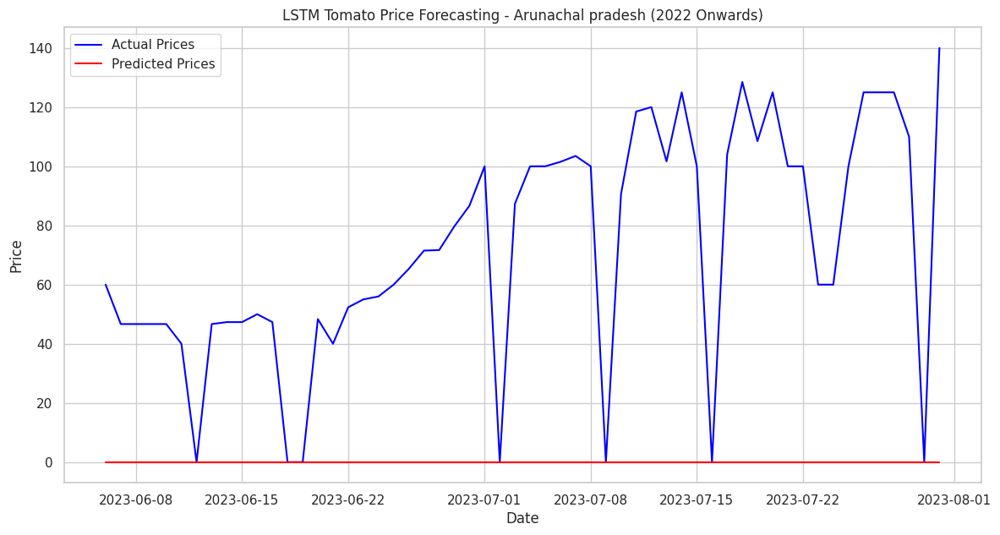

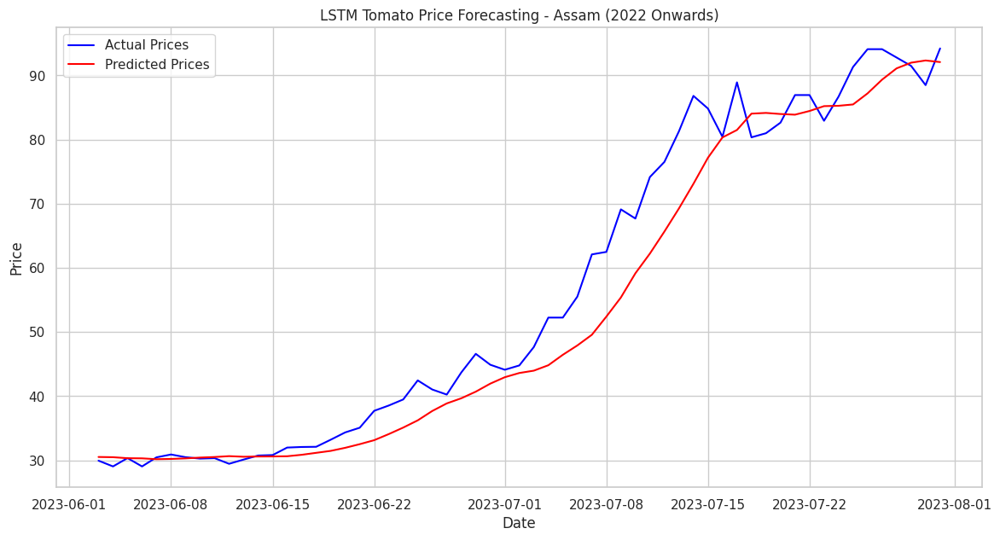

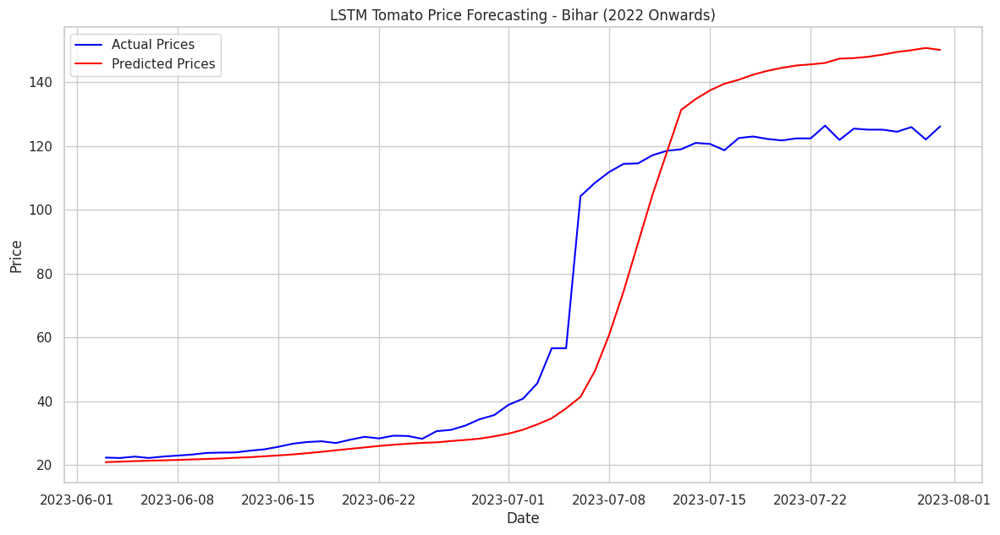

...

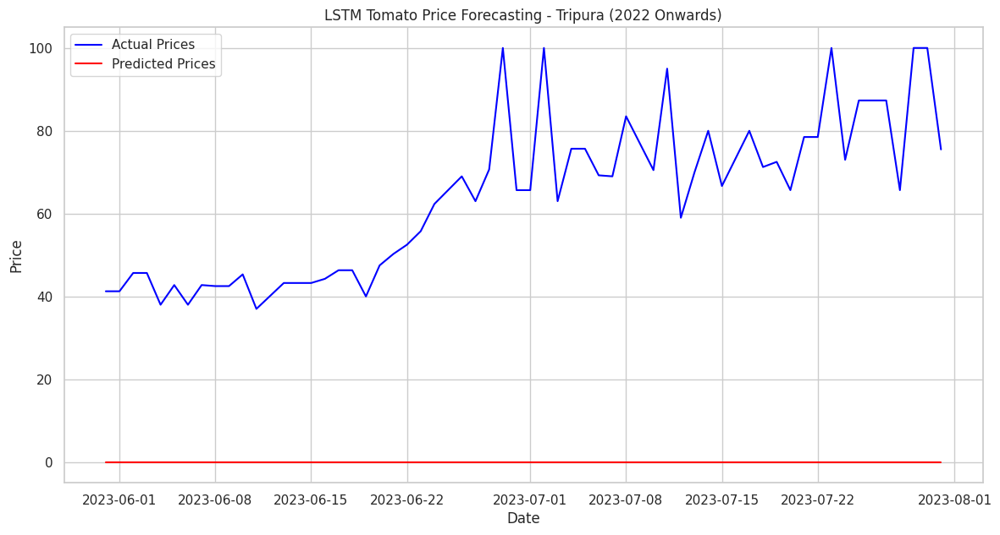

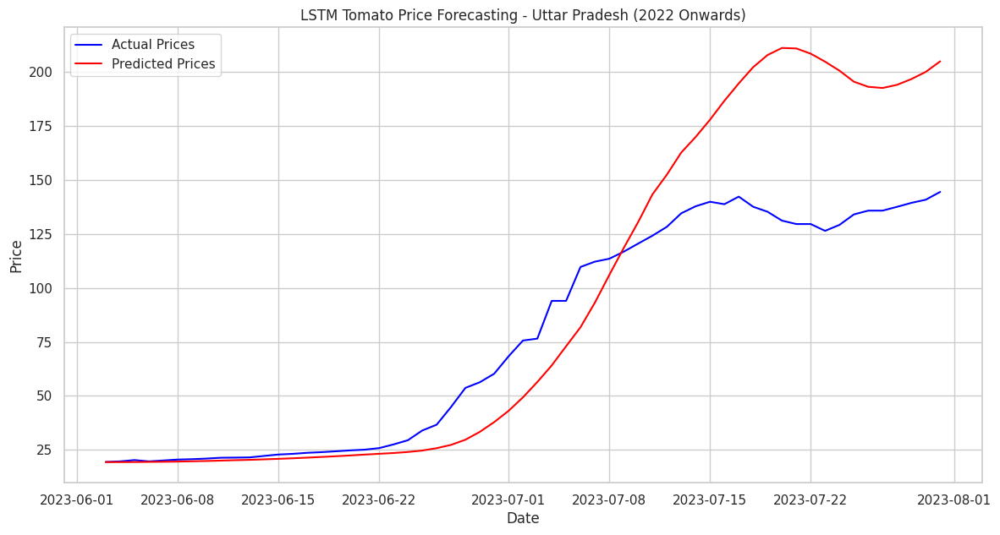

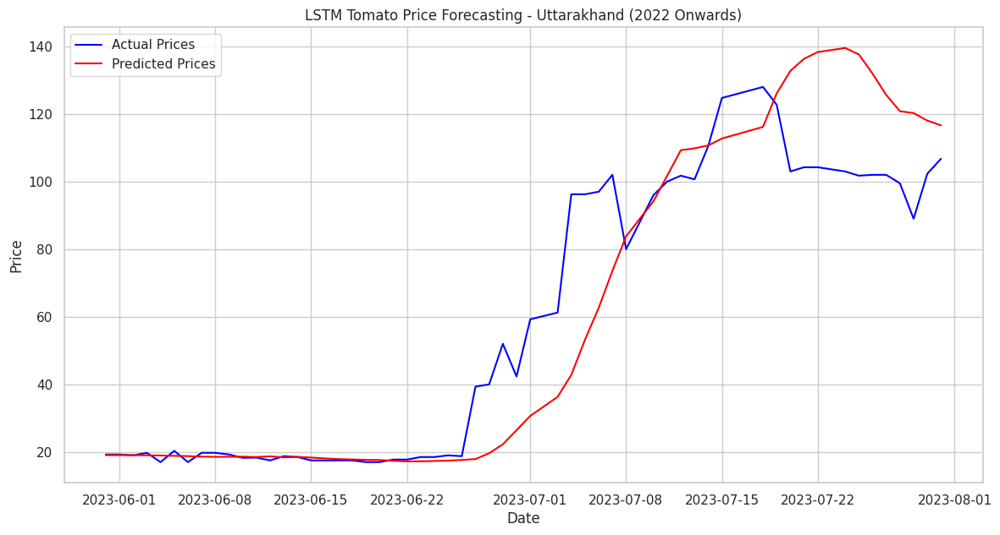

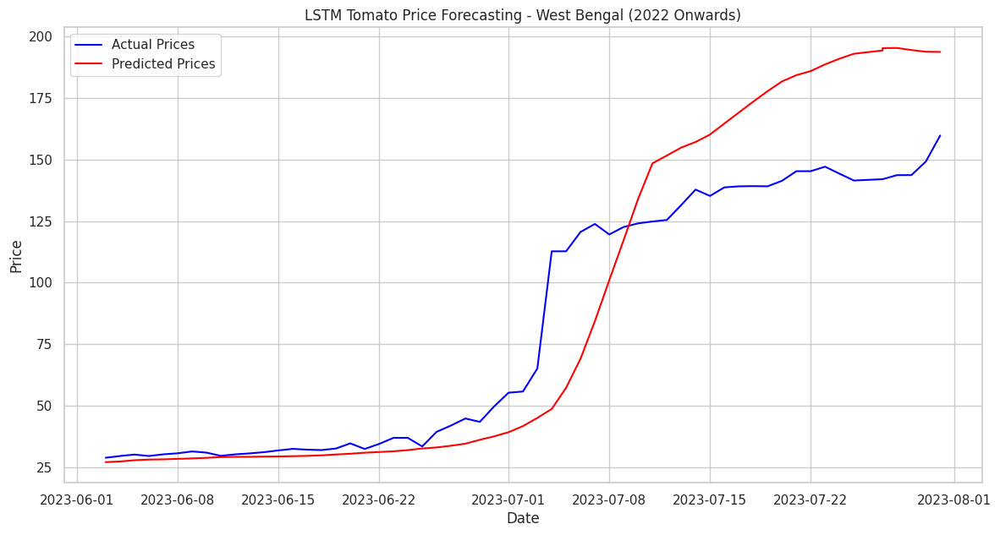

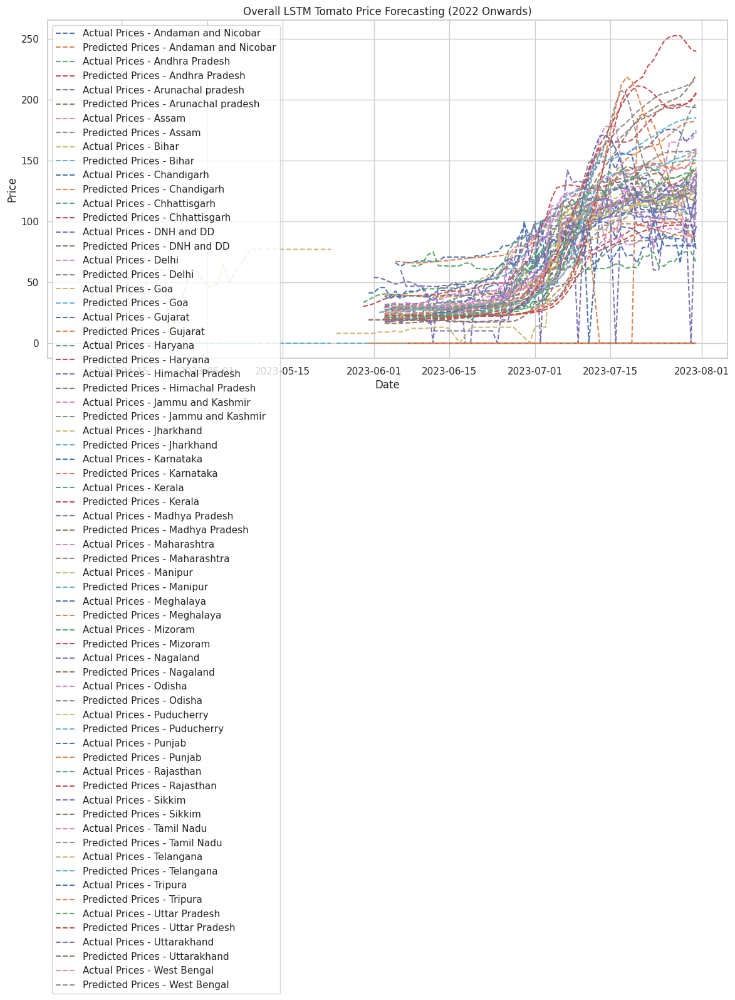

In [29]:
#Prediction for all states

grouped_data = df.groupby('States/UTs')

state_models = {}
state_predictions = {}

def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back):
        a = dataset[i:(i + look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

look_back = 7
all_states_comparison_df = pd.DataFrame()

for state, state_df in grouped_data:
    scaler = MinMaxScaler(feature_range=(0, 1))
    state_prices_normalized = scaler.fit_transform(np.array(state_df['Tomato']).reshape(-1, 1))

    X, Y = create_dataset(state_prices_normalized, look_back)

    split_point = int(len(X) * 0.8)
    X_train, X_test, Y_train, Y_test = X[:split_point], X[split_point:], Y[:split_point], Y[split_point:]

    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
    model.add(LSTM(units=50))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    model.fit(X_train, Y_train, epochs=100, batch_size=32, verbose=1)

    predictions = model.predict(X_test)
    predictions = scaler.inverse_transform(predictions)
    Y_test_inverse = scaler.inverse_transform(np.array(Y_test).reshape(-1, 1))

    print("NaN in Y_test_inverse:", np.isnan(Y_test_inverse).any())
    print("NaN in predictions:", np.isnan(predictions).any())

    Y_test_inverse = np.nan_to_num(Y_test_inverse)
    predictions = np.nan_to_num(predictions)

    mse = mean_squared_error(Y_test_inverse, predictions)
    print(f"The Mean Squared Error of the predictions for {state} is: {mse}")

    state_models[state] = model
    state_predictions[state] = (Y_test_inverse, predictions)

    state_comparison_df = pd.DataFrame({
        'Date': state_df['Date'].iloc[-len(Y_test_inverse):],
        'Actual_Price': Y_test_inverse.flatten(),
        'LSTM_Predicted_Price': predictions.flatten(),
        'State': state
    })

    print(f"\nComparison of Actual and LSTM Predicted Prices for {state}:")
    print(state_comparison_df)

    all_states_comparison_df = pd.concat([all_states_comparison_df, state_comparison_df], ignore_index=True)

print("\nFinal Overall Comparison of Actual and LSTM Predicted Prices:")
print(all_states_comparison_df)

for state, state_df in grouped_data:
    state_comparison_df = all_states_comparison_df[all_states_comparison_df['State'] == state]

    plt.figure(figsize=(14, 7))
    plt.plot(state_comparison_df['Date'], state_comparison_df['Actual_Price'], label='Actual Prices', color='blue')
    plt.plot(state_comparison_df['Date'], state_comparison_df['LSTM_Predicted_Price'], label='Predicted Prices', color='red')
    plt.title(f'LSTM Tomato Price Forecasting - {state} (2022 Onwards)')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

plt.figure(figsize=(14, 7))
for state, state_df in grouped_data:
    state_comparison_df = all_states_comparison_df[all_states_comparison_df['State'] == state]
    plt.plot(state_comparison_df['Date'], state_comparison_df['Actual_Price'], label=f'Actual Prices - {state}', linestyle='dashed')
    plt.plot(state_comparison_df['Date'], state_comparison_df['LSTM_Predicted_Price'], label=f'Predicted Prices - {state}', linestyle='dashed')

plt.title('Overall LSTM Tomato Price Forecasting (2022 Onwards)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()


In [30]:
#final prediction

import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('dbfinal.csv', parse_dates=['Date'])

# Group data by 'States/UTs'
grouped_data = df.groupby('States/UTs')

# Dictionary to store models and predictions for each state
state_models = {}
state_predictions = {}

def create_dataset(dataset, look_back=1):
    dataX, dataY = [], []
    for i in range(len(dataset) - look_back):
        a = dataset[i:(i + look_back), 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)

look_back = 7
all_states_predictions_df = pd.DataFrame()

# Loop over each state
for state, state_df in grouped_data:
    # Normalize the data
    scaler = MinMaxScaler(feature_range=(0, 1))
    state_prices_normalized = scaler.fit_transform(np.array(state_df['Tomato']).reshape(-1, 1))

    # Prepare the data for LSTM
    X, Y = create_dataset(state_prices_normalized, look_back)

    # Reshape the input data for LSTM
    X = np.reshape(X, (X.shape[0], X.shape[1], 1))

    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(X.shape[1], 1)))
    model.add(LSTM(units=50))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    model.fit(X, Y, epochs=100, batch_size=32, verbose=1)

    # Make predictions for the next 30 days
    last_sequence = state_prices_normalized[-look_back:]
    future_predictions = []

    for _ in range(30):
        next_day_prediction = model.predict(np.reshape(last_sequence, (1, look_back, 1)))
        future_predictions.append(next_day_prediction[0, 0])
        last_sequence = np.append(last_sequence[1:], next_day_prediction[0, 0])

    # Inverse transform the predictions
    future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))

    # Create a DataFrame for future predictions for the current state
    future_dates = pd.date_range(start=state_df['Date'].max() + pd.DateOffset(1), periods=30)
    future_predictions_df = pd.DataFrame({
        'Date': future_dates,
        'Predicted_Price': future_predictions.flatten(),
        'State': state  # Adding a column to store the state name
    })

    # Fill NaN values with a default value, e.g., the last known price
    default_value = state_prices_normalized[-1][0]
    future_predictions_df['Predicted_Price'].fillna(default_value, inplace=True)

    # Concatenate the state-specific future predictions DataFrame to the overall DataFrame
    all_states_predictions_df = pd.concat([all_states_predictions_df, future_predictions_df], ignore_index=True)

# Display the final overall future predictions DataFrame for all states
print("\nPrice Predictions:")
print(all_states_predictions_df)

Streaming output truncated to the last 5000 lines.
Epoch 39/100
10/10 [==============================] - 0s 21ms/step - loss: 0.0019
Epoch 40/100
10/10 [==============================] - 0s 23ms/step - loss: 0.0018
Epoch 41/100
10/10 [==============================] - 0s 20ms/step - loss: 0.0019
Epoch 42/100
10/10 [==============================] - 0s 21ms/step - loss: 0.0018
Epoch 43/100
10/10 [==============================] - 0s 19ms/step - loss: 0.0017
Epoch 44/100
10/10 [==============================] - 0s 20ms/step - loss: 0.0016
Epoch 45/100
10/10 [==============================] - 0s 19ms/step - loss: 0.0017
Epoch 46/100
10/10 [==============================] - 0s 21ms/step - loss: 0.0016
Epoch 47/100
10/10 [==============================] - 0s 19ms/step - loss: 0.0015
Epoch 48/100
10/10 [==============================] - 0s 20ms/step - loss: 0.0014
Epoch 49/100
10/10 [==============================] - 0s 21ms/step - loss: 0.0015
Epoch 50/100
10/10 [===========================